<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc" style="margin-top: 1em;"><ul class="toc-item"><li><span><a href="#Convolutional-Neural-Network" data-toc-modified-id="Convolutional-Neural-Network-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Convolutional Neural Network</a></span><ul class="toc-item"><li><span><a href="#Visualizing-and-Understanding-Convolutional-Networks" data-toc-modified-id="Visualizing-and-Understanding-Convolutional-Networks-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Visualizing and Understanding Convolutional Networks</a></span></li><li><span><a href="#Data-Augmentation" data-toc-modified-id="Data-Augmentation-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Data Augmentation</a></span></li><li><span><a href="#Q:-Why-would-we-care-about-the-resilency-of-where-we-are-in-the-weight-space---isn’t-low-loss-the-only-thing-that-we-care-about?-Low-loss-==-being-close-to-global-minimum." data-toc-modified-id="Q:-Why-would-we-care-about-the-resilency-of-where-we-are-in-the-weight-space---isn’t-low-loss-the-only-thing-that-we-care-about?-Low-loss-==-being-close-to-global-minimum.-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Q: Why would we care about the resilency of where we are in the weight space - isn’t low loss the only thing that we care about? Low loss == being close to global minimum.</a></span></li></ul></li></ul></div>

# Convolutional Neural Network 
DL1 [59:13]

Linear Layer
http://setosa.io/ev/image-kernels/

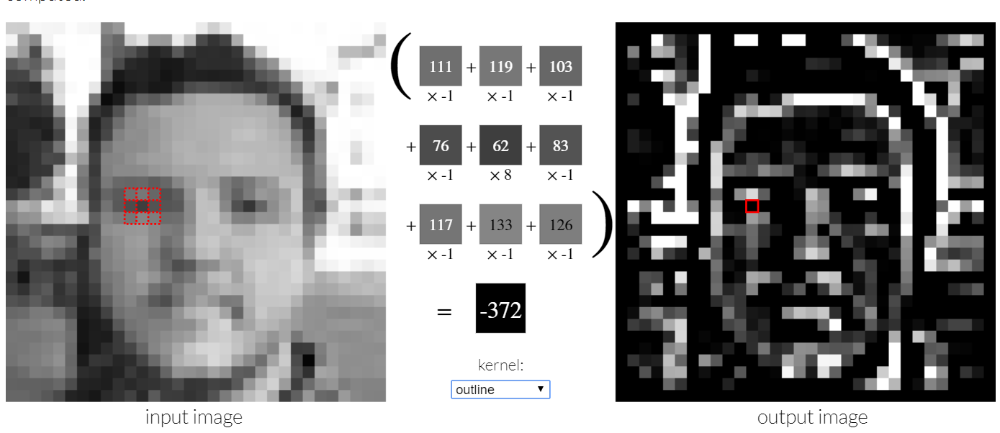

## Visualizing and Understanding Convolutional Networks 
[01:08:27]
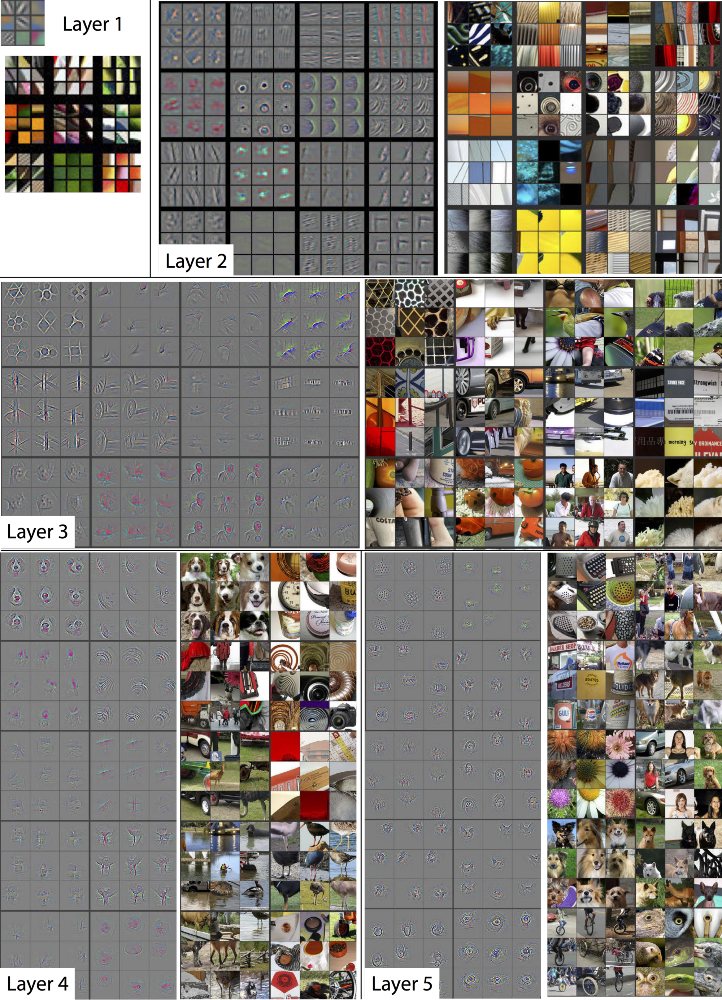

## Question: What are the grey images vs. the ones on the right?

Layer 1, they are exactly what the filters look like. It is easy to visualize because input to it are pixels. Later on, it gets harder because inputs are themselves activations which is a combination of activations. Zeiler and Fergus came up with a clever technique to show what the filters tend to look like on average — called deconvolution (we will learn in Part 2). Ones on the right are the examples of patches of image which activated that filter highly.

We started with something incredibly simple but if we use it as a big enough scale, thanks to the universal approximation theorem and the use of multiple hidden layers in deep learning, we actually get the very very rich capabilities. This is actually what we used when we used when we trained our dog vs cat recognizer.

## Data Augmentation 
[15:50]
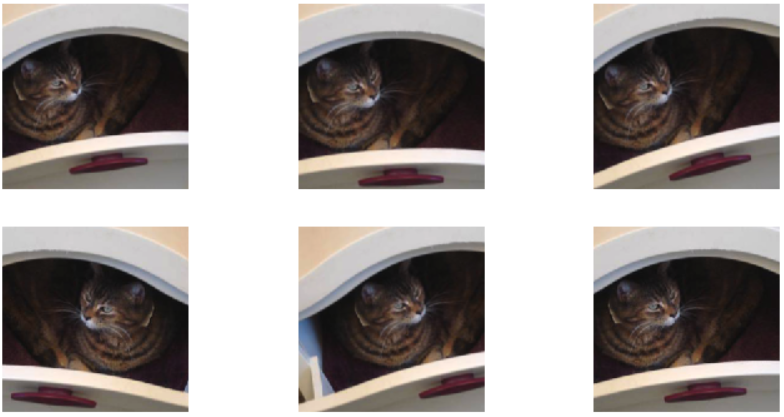

Every epoch, we will randomly change the image a little bit. In other words, the model is going to see slightly different version of the image each epoch.
You want to use different types of data augmentation for different types of image (flip horizontally, vertically, zoom in, zoom out, vary contrast and brightness, and many more).

```
tfms = tfms_from_model(resnet34, sz, aug_tfms=transforms_side_on, max_zoom=1.1)
```
transform_side_on — a predefined set of transformations for side-on photos (there is also transform_top_down). Later we will learn how to create custom transform lists.
It is not exactly creating new data, but allows the convolutional neural net to learn how to recognize cats or dogs from somewhat different angles.


Now we created a new data object that includes augmentation. Initially, the augmentations actually do nothing because of precompute=True.
Convolutional neural network have these things called “activations.” An activation is a number that says “this feature is in this place with this level of confidence (probability)”. We are using a pre-trained network which has already learned to recognize features (i.e. we do not want to change hyper parameters it learned), so what we can do is to pre-compute activations for hidden layers and just train the final linear portion.

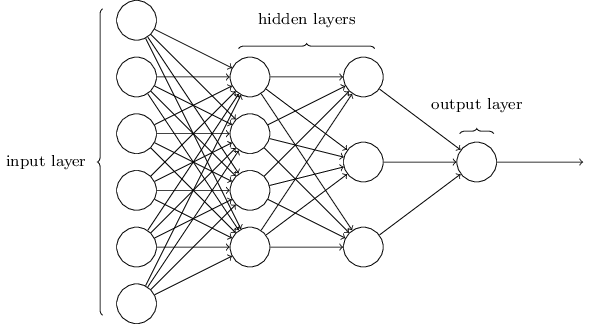

This is why when you train your model for the first time, it takes longer — it is pre-computing these activations.
Even though we are trying to show a different version of the cat each time, we had already pre-computed the activations for a particular version of the cat (i.e. we are not re-calculating the activations with the altered version).
To use data augmentation, we have to do learn.precompute=False:

Theory: What is actually going on behind the scenes with convolutional neural network [42:17]
We saw a little bit of theory in Lesson 1 — http://setosa.io/ev/image-kernels/
Convolution is something where we have a little matrix (nearly always 3x3 in deep learning) and multiply every element of that matrix by every element of 3x3 section of an image and add them all together to get the result of that convolution at one point.

[Otavio’s Youtube](https://youtu.be/Oqm9vsf_hvU)

- Activation: A number that is calculated by applying some kind of linear operation to some numbers in the input.
-Rectified Linear Unit (ReLU): Throw away negative — i.e. MAX(0, x)
- Filter/Kernel: A 3x3 slice of a 3D tensor you used for convolution
- Tensor: Multidimensional array or matrix Hidden Layer A layer that is neither input nor output
- Max pooling: A (2,2) max pooling will halve the resolution in both height and width — think of it as a summary
- Fully connected layer: Give a weight to each and every single activation and calculate the sum product. - Weight matrix is as big as the entire input.

Note: There are many things you can do after the max pooling layer. One of them is to do another max pool across the entire size. In older architectures or structured data, we do fully connected layer. Architecture that make heavy use of fully connected layers are prone to overfitting and are slower. ResNet and ResNext do not use very large fully connected layers.


Question: What happens if the input had 3 channels? [1:05:30] It will look something similar to the Conv1 layer which has 2 channels — therefore, filters have 2 channels per filter. Pre-trained ImageNet models use 3 channels. Some of the techniques you can use when you do when you do have less than 3 channel is to either duplicate one of the channels to make it 3, or if you have 2, then get an average and consider that as the third channel. If you have 4 channels, you could add extra level to the convolutional kernel with all zeros.

We have gotten as far as fully connected layer (it does classic matrix product). In the excel sheet, there is one activation. If we want to look at which one of ten digit the input is, we actually want to calculate 10 numbers.

Let’s look at an example where we are trying to predict whether a picture is a cat, a dog, or a plane, or fish, or a building. Our goal is:

Take output from the fully connected layer (no ReLU so there may be negatives)
Calculate 5 numbers where each of them is between 0 and 1 and they add up to 1.
To do this, we need a different kind of activation function (a function applied to an activation).

Why do we need non-lineality? If you stack multiple linear layers, it is still just a linear layer. By adding non-linear layers, we can fit arbitrarily complex shapes. The non-linear activation function we used was ReLU.



Softmax [01:14:08]
Softmax only ever occurs in the final layer. It outputs numbers between 0 and 1, and they add up to 1. In theory, this is not strictly necessary — we could ask out neural net to learn a set of kernels which give probabilities that line up as closely as possible with what we want. In general with deep learning, if you can construct your architecture so that the desired characteristics are as easy to express as possible, you will end up with better models (learn more quickly and with less parameters).



References:
    - [Convolutional Neural Network in 5 minutes](https://hackernoon.com/convolutional-neural-network-in-5-minutes-8f867eb9ca39)